<p align = "center" draggable=”false” ><img src="https://user-images.githubusercontent.com/37101144/161836199-fdb0219d-0361-4988-bf26-48b0fad160a3.png" 
     width="200px"
     height="auto"/>
</p>

# Eletronics Purchase Prediction

Today you are a machine learning engineer in the Department of Marketing and Inventory at Walmart Labs. You have access to the Walmart server data, specifically the Electronics section. However, there is no customer facing information, but you do have access to timestamped data regarding product viewing/carting/purchasing. We will use this data to build a model of whether or not some product will be purchased.

Data is adapted from [e-commerce behavior data on Kaggle](https://www.kaggle.com/mkechinov/ecommerce-behavior-data-from-multi-category-store). 

This file contains behavior data from a large multi-category store. Each row in the file represents an event. All events are related to products and users. Each event has a many-to-many relationship between users and products. 

## Learning Objectives

At the end of this session, you will be able to

- Leverage `pandas_profiling` for fast data understanding
- Practice data preprocessing
- Build logistic regression / SVM / Gradient Boosting
- Evaluate models with proper metrics
- Interpret black box models with SHAP
- Generate optimal pipeline for classification task using AutoML

## Task 1: Load data

Let's start by looking at the descriptions before loading in the csv files.

1. Use the `IPython.display` module to view the `some_column_descriptions.png` file. Look through the column names and descriptions to get an idea of what the data is.

In [1]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import plotly
import sklearn
import shap
import tpot
import streamlit as st

In [2]:
pwd

'/mnt/f/4b/code/FrederickMLE-9/assignments/week-6-supervised-ML/nb'

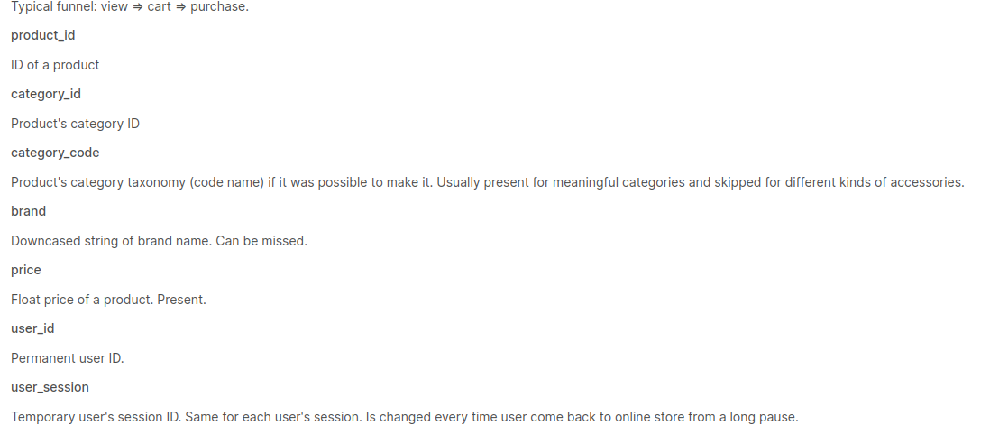

In [3]:
from IPython.display import Image, display
# change the filename to wherever you downloaded/uploaded the file
filename = '../img/some_column_descriptions.png'
display(Image(filename=filename))

The dataset has User-journey data, i.e., it tracks information on user/product pairs over time to see if the combination results in a purchase.

2. Look at the `user_journey_descriptions.png` file. Review the data sample to get a sense of what information we are tracking for each user/product pair.

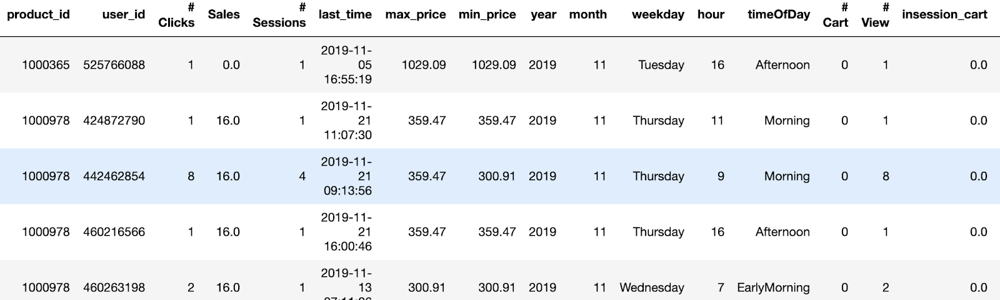

In [4]:
# change path to wherever you uploaded/downloaded the file
filename='../img/user_journey_descriptions.png'
display(Image(filename=filename))

The dataset we are working with is essentially what we have screenshotted above, but has been anonymized by removing product IDs and user IDs.

3. Use the pandas `read_csv()` and `head()` functions to read in the training data (`../dat/train.csv.gz`) and look at the first few rows.

    Note the `Purchase` column has values either 0 (not purchased) or 1 (purchased).

In [5]:
import pandas as pd
filepath = '../dat/train.csv.gz'
train_df = pd.read_csv(filepath)

In [6]:
train_df.head()

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,2019,11,Sat,Morning,0,0
1,1,1,0.0,92.67,92.67,0,1,0,1,2019,11,Fr,Dawn,0,0
2,1,1,0.0,155.71,155.71,0,1,0,1,2019,11,Thu,Afternoon,0,0
3,1,1,0.0,898.32,898.32,0,1,0,1,2019,11,Mon,Noon,0,0
4,1,1,0.0,146.21,146.21,0,1,0,1,2019,11,Tue,Noon,0,0


4. What is the dimension of the training data?

In [7]:
train_df.shape

(645816, 15)

5. Similarly, read in the test data `../dat/test.csv.gz` and check its dimension.

In [8]:
filepath = '../dat/test.csv.gz'
test_df = pd.read_csv(filepath)
test_df.shape

(430544, 15)

In [9]:
# looking at the split:
dataset_rows = train_df.shape[0] + test_df.shape[0]
train_split = train_df.shape[0]/dataset_rows
test_split = test_df.shape[0]/dataset_rows

print(f'Our dataset includes:\n\t'
      f'training set: \t{train_df.shape[0]:8d} rows\n\t'
      f'test set: \t{test_df.shape[0]:8d} rows\n\t'
      f'total size: \t{dataset_rows:8d} rows\n\t'
      f'all rows have: \t{train_df.shape[1]:8d} columns\n\t'
      f'    % train: \t{train_split:.2%} of total dataset\n\t'
      f'    % test: \t{test_split:.2%} of total dataset')

Our dataset includes:
	training set: 	  645816 rows
	test set: 	  430544 rows
	total size: 	 1076360 rows
	all rows have: 	      15 columns
	    % train: 	60.00% of total dataset
	    % test: 	40.00% of total dataset


## Task 2: Understand data

Our goal here is to predict whether a customer/product pair will result in a purchase. 
To do this, we will want to identify the most important features for classification. 

Before digging into each column, let's leverage `pandas_profiling`, that goes beyond `pd.DataFrame.describe()`, to get a big picture of our data set. 

1. From `pandas_profiling` import `ProfileReport`. 
    
    For faster iteration, create a profile report object `profile` with 10,000 samples from `train_df`. 
    
    Set its `title` as "Pandas Profiling Electronics Purchase Report". 
    
    For sampling, use `pd.DataFrame.sample(10000, randome_state=3)`. 

In [10]:
# YOUR CODE HERE
sample_10k = train_df.sample(10000, random_state=3)
profile = ProfileReport(sample_10k, title='Pandas Profiling Electronic Purchase Report')

   Show the report inside the notebook, go over the report and check each tab; especially the "Alerts". 

In [11]:
%%time
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 6.34 s, sys: 221 ms, total: 6.56 s
Wall time: 6.53 s


<div class="alert alert-info">
    <h4><i>..OK, that's impressive profiling...</i></h4>
    </div>

In [12]:
# Let's save the html report:
profile.to_file('pandas_profiling_analysis_sample_10k_train_df.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

2. Pandas profiling Profile reports that there are 5 numeric variables and 11 categorical variables. Let's print out the datatype of each feature (column) and understand how the profiler infers data type. 

In [13]:
#YOUR CODE HERE
# First, let's see how pandas is typing the data:
sample_10k.dtypes

NumOfEventsInJourney      int64
NumSessions               int64
interactionTime         float64
maxPrice                float64
minPrice                float64
NumCart                   int64
NumView                   int64
InsessionCart             int64
InsessionView             int64
year                      int64
month                     int64
weekday                  object
timeOfDay                object
Weekend                   int64
Purchase                  int64
dtype: object

In [14]:
# quite a bit different from pandas_profiler's inferred
# data typing...
# again, looking at summary stats of sample_10k dataframe using pandas:
sample_10k.describe(include='all')

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,year,month,weekday,timeOfDay,Weekend,Purchase
count,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.0,10000.0,10000,10000,10000.0,10000.000000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Sat,Afternoon,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1987,2417,NaN,NaN
mean,1.031600,1.018900,5.337376e+03,291.383345,291.326647,0.048200,0.967900,0.053000,1.18660,2019.0,11.0,NaN,NaN,0.0,0.015500
std,0.193921,0.148812,6.914284e+04,353.872518,353.801417,0.222894,0.285793,0.231509,0.65347,0.0,0.0,NaN,NaN,0.0,0.123537
min,1.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2019.0,11.0,NaN,NaN,0.0,0.000000
25%,1.000000,1.000000,0.000000e+00,69.500000,69.500000,0.000000,1.000000,0.000000,1.00000,2019.0,11.0,NaN,NaN,0.0,0.000000
50%,1.000000,1.000000,0.000000e+00,167.030000,167.030000,0.000000,1.000000,0.000000,1.00000,2019.0,11.0,NaN,NaN,0.0,0.000000
75%,1.000000,1.000000,0.000000e+00,360.340000,360.340000,0.000000,1.000000,0.000000,1.00000,2019.0,11.0,NaN,NaN,0.0,0.000000


##### _Comparing datatypes of column features in sample_10k dataframe_
_(as reported by pandas and pandas_profiler):_

```
feature (column):     pd dtype:    data type inferred     distinct types (# & %)
(variable)                         by pandas_profiler:    for categorical types,
                                                          (pandas_profiler):
df_index                    -          real number                                                         
NumOfEventsInJourney      int64        categorical            4 (<0.1%)      
NumSessions               int64        categorical            4 (<0.1%)
interactionTime         float64        real number
maxPrice                float64        real number
minPrice                float64        real number
NumCart                   int64        categorical            4 (<0.1%)
NumView                   int64        categorical            5 (<0.1%)
InsessionCart             int64        categorical            4 (<0.1%)
InsessionView             int64        real number
year                      int64        categorical            1 (<0.1%)
month                     int64        categorical            1 (<0.1%)
weekday                  object        categorical            7 ( 0.1%)
timeOfDay                object        categorical            7 ( 0.1%)
Weekend                   int64        categorical            1 (<0.1%)
Purchase                  int64        categorical            2 (<0.1%)
```

In [15]:
# can pandas_profiling handle the entire training set?
# (645816 records!)
# let's first make a copy of train_df and try to generate
# ProfileReport from that (in the event that failure/crash
# corrupts the target dataframe):
sample_all = train_df.copy(deep=True)
profile_all = ProfileReport(sample_all, title='Pandas Profiling Electronic Purchase Report on All Train')

In [16]:
%%time
profile_all.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

CPU times: user 26.3 s, sys: 3.01 s, total: 29.3 s
Wall time: 24.4 s


In [17]:
# OK, that wasn't bad at all: but profiling the entire train_df
# bumped system RAM usage by about 2-3GB
#
# let's save this complete profile report too:
profile_all.to_file('pandas_profiling_analysis_all_train_df.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### _Looking at the ProfileReport on the entire train_df data:_
Comparing sample_10k to complete reports, we see several notable differences:
* No. variables: 16 → 15 (pp has figured out that __df_index__ is not a variable)
* No. numeric variables: 5 → 9 (pp has inferred __4 additional columns as numeric type):__
    * __NumOfEvents   (categorical → numeric)__
    * __NumSessions   (categorical → numeric)__
    * interactionTime (numeric)
    * maxPrice        (numeric)
    * minPrice        (numeric)
    * __NumCart       (categorical → numeric)__
    * __NumView       (categorical → numeric)__
    * __InsessionCart (categorical → numeric)__
    * InsessionView   (numeric)
* The same 3 columns are ___rejected___: year, month, Weekend
* InsessionView variable is noted as ___skewed___
* NumCart is noted to be 95.5% ___zeros___

___These data type inferences seem more sensible than those derived from  
the 10k random sampling data.___

3. From the report, we see that `year`, `month`, and `Weekend` were "Rejected" as there is only one distinct value for each column. 
These features are not informative, so we remove the three features from the training set. To do this, pass the `columns` argument to the `.drop()` method. 
Make sure to use `inplace=True` to modify the DataFrame. 
Print the shape of the DataFrames to verify the columns were dropped.

In [18]:
assert train_df.shape[1] == 15
train_df.drop(['year', 'month', 'Weekend'], axis=1, inplace=True)
assert train_df.shape[1] == 12

In [19]:
# take a quick look at train_df:
train_df

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,Sat,Morning,0
1,1,1,0.0,92.67,92.67,0,1,0,1,Fr,Dawn,0
2,1,1,0.0,155.71,155.71,0,1,0,1,Thu,Afternoon,0
3,1,1,0.0,898.32,898.32,0,1,0,1,Mon,Noon,0
4,1,1,0.0,146.21,146.21,0,1,0,1,Tue,Noon,0
...,...,...,...,...,...,...,...,...,...,...,...,...
645811,1,1,0.0,128.67,128.67,0,1,0,2,Sat,EarlyMorning,0
645812,1,1,0.0,244.51,244.51,0,1,0,1,Thu,EarlyMorning,0
645813,1,1,0.0,152.82,152.82,0,1,0,1,Sun,EarlyMorning,0
645814,1,1,0.0,190.22,190.22,0,1,0,1,Wed,Evening,0


4. Repeat the steps for `test_df`:

In [20]:
test_df.drop(['year', 'month', 'Weekend'], axis=1, inplace=True)
assert test_df.shape[1] == train_df.shape[1]

In [21]:
# take a quick look at test_df:
test_df

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,126.86,126.86,0,1,0,1,Wed,EarlyMorning,0
1,2,2,182.0,118.38,118.38,0,2,0,1,Fr,EarlyMorning,0
2,1,1,0.0,63.77,63.77,0,1,0,1,Fr,Morning,0
3,1,1,0.0,32.18,32.18,0,1,0,3,Fr,EarlyMorning,0
4,1,1,0.0,1093.72,1093.72,0,1,0,2,Sat,EarlyMorning,0
...,...,...,...,...,...,...,...,...,...,...,...,...
430539,1,1,0.0,25.48,25.48,0,1,0,1,Wed,Evening,0
430540,1,1,0.0,16.47,16.47,0,1,0,1,Sat,Morning,0
430541,1,1,0.0,38.61,38.61,0,1,0,2,Thu,Evening,0
430542,3,2,142943.0,486.47,427.16,0,3,0,2,Sun,Dawn,0


5. As you can see from the profile report, `weekday` and `timeOfDay` each has 7 distinct values. 
Convert these non-numeric features to numeric. 

    These feature values are ordered temporally, so it makes sense to convert them to numeric type. 
    Follow the example given for the `weekday` column to update the `timeOfDay` column.
    Use the `.head()` method to inspect the dataset after the transformations.

In [22]:
# take a look at train_df before transformation:
train_df.head(5)

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,Sat,Morning,0
1,1,1,0.0,92.67,92.67,0,1,0,1,Fr,Dawn,0
2,1,1,0.0,155.71,155.71,0,1,0,1,Thu,Afternoon,0
3,1,1,0.0,898.32,898.32,0,1,0,1,Mon,Noon,0
4,1,1,0.0,146.21,146.21,0,1,0,1,Tue,Noon,0


In [23]:
weekday_str2num = {
    s: i+1 for i, s in enumerate(['Mon', 'Tue', 'Wed', 'Thu', 'Fr', 'Sat', 'Sun'])
}
train_df['weekday'] = train_df['weekday'].replace(weekday_str2num)
train_df['weekday'].unique()

array([6, 5, 4, 1, 2, 3, 7])

In [24]:
# train_df after transformation:
train_df.head(5)

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,6,Morning,0
1,1,1,0.0,92.67,92.67,0,1,0,1,5,Dawn,0
2,1,1,0.0,155.71,155.71,0,1,0,1,4,Afternoon,0
3,1,1,0.0,898.32,898.32,0,1,0,1,1,Noon,0
4,1,1,0.0,146.21,146.21,0,1,0,1,2,Noon,0


In [25]:
timeOfDay_str2num = {
    s: i+1 for i, s in enumerate(['Dawn', 'EarlyMorning', 'Morning', 'Noon', \
                                  'Afternoon', 'Evening', 'Night'])
}
train_df['timeOfDay'] = train_df['timeOfDay'].replace(timeOfDay_str2num)
train_df['timeOfDay'].unique()

array([3, 1, 5, 4, 6, 2, 7])

In [26]:
# train_df after 2nd transformation:
train_df.head(5)

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,154.41,154.41,0,1,0,1,6,3,0
1,1,1,0.0,92.67,92.67,0,1,0,1,5,1,0
2,1,1,0.0,155.71,155.71,0,1,0,1,4,5,0
3,1,1,0.0,898.32,898.32,0,1,0,1,1,4,0
4,1,1,0.0,146.21,146.21,0,1,0,1,2,4,0


6. Do the same for `test_df`, that is, to convert `weekday` and `timeOfDay` into numeric type. 

In [27]:
# double check our dictionaries:

# allow multiple outputs from Jupyter notebook cell
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

print(weekday_str2num,'\n',
      timeOfDay_str2num)

{'Mon': 1, 'Tue': 2, 'Wed': 3, 'Thu': 4, 'Fr': 5, 'Sat': 6, 'Sun': 7} 
 {'Dawn': 1, 'EarlyMorning': 2, 'Morning': 3, 'Noon': 4, 'Afternoon': 5, 'Evening': 6, 'Night': 7}


In [28]:
# look at test_df before applying transformations:
test_df.head(7)

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,126.86,126.86,0,1,0,1,Wed,EarlyMorning,0
1,2,2,182.0,118.38,118.38,0,2,0,1,Fr,EarlyMorning,0
2,1,1,0.0,63.77,63.77,0,1,0,1,Fr,Morning,0
3,1,1,0.0,32.18,32.18,0,1,0,3,Fr,EarlyMorning,0
4,1,1,0.0,1093.72,1093.72,0,1,0,2,Sat,EarlyMorning,0
5,1,1,0.0,51.46,51.46,0,1,0,1,Fr,EarlyMorning,0
6,1,1,0.0,324.08,324.08,0,1,0,2,Wed,Afternoon,0


In [29]:
test_df['weekday'] = test_df['weekday'].replace(weekday_str2num)
test_df['timeOfDay'] = test_df['timeOfDay'].replace(timeOfDay_str2num)

In [30]:
# test_df after transformations:
test_df.head(7)

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
0,1,1,0.0,126.86,126.86,0,1,0,1,3,2,0
1,2,2,182.0,118.38,118.38,0,2,0,1,5,2,0
2,1,1,0.0,63.77,63.77,0,1,0,1,5,3,0
3,1,1,0.0,32.18,32.18,0,1,0,3,5,2,0
4,1,1,0.0,1093.72,1093.72,0,1,0,2,6,2,0
5,1,1,0.0,51.46,51.46,0,1,0,1,5,2,0
6,1,1,0.0,324.08,324.08,0,1,0,2,3,5,0


7. Use the `Purchase` column in training set to determine the proportion of user journeys that result in purchases.  Compare it to what the profile reports. Is the dataset balanced?

In [31]:
print("Number of purchases vs non-purchases in train set:")
print(train_df.Purchase.value_counts())
print(f"Percent of rows resulting in purchase: \t\t"
      f"{train_df['Purchase'].sum()/train_df.shape[0]:.4%}")

Number of purchases vs non-purchases in train set:
0    636839
1      8977
Name: Purchase, dtype: int64
Percent of rows resulting in purchase: 		1.3900%


In [32]:
# the pandas_profiling report above, which was run on
# sample_10k (a df of 10,000 rows sampled randomly
# from train_df) shows:

# no. non-purchases:
sample_10k_np = 9845

# no. purchases:
sample_10k_p = 155

print(f'The pandas_profiling report estimates that the\n'
      f'percent of rows resulting in purchase = \t'
      f'{sample_10k_p/(sample_10k_p + sample_10k_np):.4%}')

The pandas_profiling report estimates that the
percent of rows resulting in purchase = 	1.5500%


### _Answer:_

_:. The % purchases in sample_10k, 1.5500% ≈ % purchases  
calculated using all train_df data (1.3900%), and thus gives a  
reasonable approximation of proportion of rows resulting in a  
purchase._ 

___More importantly, however, both the estimated & actual  
ratio of purchases to non-purchases are severely imbalanced  
between these binary outcome classes we are trying to predict:___  
`non-purchases : purchases ≈ 70.9 : 1`

## Task 3: Preprocess Data

Correlated features in general don't improve models (although it depends on the specifics of the problem like the number of variables and the degree of correlation), but they affect specific models in different ways and to varying extents:

- For linear models (e.g., linear regression or logistic regression), [multicolinearity](https://en.wikipedia.org/wiki/Multicollinearity) can yield [solutions that are wildly varying and possibly numerically unstable](https://en.wikipedia.org/wiki/Multicollinearity#Consequences).
- Random forest can be good at detecting interactions between different features, but highly correlated features can mask these interactions.
More generally, this can be viewed as a special case of [Occam's razor](https://en.wikipedia.org/wiki/Occam%27s_razor). A simpler model is preferable, and, in some sense, a model with fewer features is simpler. The concept of [minimum description length](https://en.wikipedia.org/wiki/Minimum_description_length) makes this more precise ([ref](https://datascience.stackexchange.com/questions/24452/in-supervised-learning-why-is-it-bad-to-have-correlated-features)).

1. How many features does our dataset currently have?

In [33]:
assert train_df.shape[1]==test_df.shape[1]
print(f'# features of current dataset in both\n'
      f'  train & test = {train_df.shape[1]:3d}')

# features of current dataset in both
  train & test =  12


2. Drop the features with high correlation.

    In the "Correlations" tab in the profile report, you can find heatmap using five different correlation metrics; toggle correlation desciptions if any one of them looks foreign to you.  

    We'll remove high correlated features by looking at each pair of features, and if they are highly correlated (at least 0.8), we won't include the second feature in the pair. Store the remaining set of features (the ones you didn't drop) in dataframes `train_df_reduced`. You are given most the code, make sure that you understand what each line does.
    
    First, calculate the correlation with just 10,000 samples.

In [34]:
train_small_df = train_df.copy().sample(n=int(1e4), random_state=12) 

In [35]:
# check dataframes:
print(train_small_df.shape)
print(train_df.shape)

(10000, 12)
(645816, 12)


In [36]:
# calculate correlation with 10k samples
# we choose Spearman correlation since many of the variables
# are ordinal (and not continuous)
cor = train_small_df.corr(method='spearman')
cor

,NumOfEventsInJourney,NumSessions,interactionTime,maxPrice,minPrice,NumCart,NumView,InsessionCart,InsessionView,weekday,timeOfDay,Purchase
NumOfEventsInJourney,1.000000,0.795622,0.999832,0.031191,0.029715,0.141729,0.499059,0.136981,0.101944,0.027379,-0.021498,0.105189
NumSessions,0.795622,1.000000,0.802800,0.028159,0.026328,0.123751,0.394661,0.115542,0.014127,0.015675,-0.032087,0.085684
interactionTime,0.999832,0.802800,1.000000,0.031361,0.029859,0.141022,0.499125,0.136259,0.100429,0.027327,-0.021738,0.104799
maxPrice,0.031191,0.028159,0.031361,1.000000,0.999990,-0.006145,0.019346,-0.004600,-0.022898,0.012550,-0.017239,0.007678
minPrice,0.029715,0.026328,0.029859,0.999990,1.000000,-0.006181,0.018466,-0.004626,-0.022959,0.012489,-0.017195,0.007593
NumCart,0.141729,0.123751,0.141022,-0.006145,-0.006181,1.000000,-0.644357,0.937627,-0.367483,0.029769,-0.011895,-0.002159
NumView,0.499059,0.394661,0.499125,0.019346,0.018466,-0.644357,1.000000,-0.605382,0.450787,-0.013602,0.009381,-0.377282
InsessionCart,0.136981,0.115542,0.136259,-0.004600,-0.004626,0.937627,-0.605382,1.000000,-0.334777,0.034343,-0.012858,0.007384
InsessionView,0.101944,0.014127,0.100429,-0.022898,-0.022959,-0.367483,0.450787,-0.334777,1.000000,0.040709,0.071907,-0.227212
weekday,0.027379,0.015675,0.027327,0.012550,0.012489,0.029769,-0.013602,0.034343,0.040709,1.000000,-0.041146,0.021450


In [37]:
import numpy as np

keep_columns = np.full(cor.shape[0], True)
for i in range(cor.shape[0] - 1):
    for j in range(i + 1, cor.shape[0] - 1):
        if (np.abs(cor.iloc[i, j]) >= 0.8):
            keep_columns[j] = False
selected_columns = train_df.columns[keep_columns]
train_df_reduced = train_df[selected_columns]

In [38]:
print(selected_columns) 

Index(['NumOfEventsInJourney', 'NumSessions', 'maxPrice', 'NumCart', 'NumView',
       'InsessionView', 'weekday', 'timeOfDay', 'Purchase'],
      dtype='object')


3. How many columns are left in the DataFrame?

In [39]:
# YOUR CODE HERE
print(f'There are {train_df_reduced.shape[1]} columns in the DataFrame.')
print(f'DataFrame shape is: {train_df_reduced.shape}')

There are 9 columns in the DataFrame.
DataFrame shape is: (645816, 9)


In [40]:
train_df_reduced.columns

Index(['NumOfEventsInJourney', 'NumSessions', 'maxPrice', 'NumCart', 'NumView',
       'InsessionView', 'weekday', 'timeOfDay', 'Purchase'],
      dtype='object')

4. Remove the same features from the test set and save in a new dataframe `test_df_reduced`.

In [41]:
test_df_reduced = test_df[selected_columns]
assert test_df_reduced.shape[1] == 9
print(test_df_reduced.shape)

(430544, 9)


In [42]:
train_df_reduced.describe(include='all')

,NumOfEventsInJourney,NumSessions,maxPrice,NumCart,NumView,InsessionView,weekday,timeOfDay,Purchase
count,645816.000000,645816.000000,645816.000000,645816.000000,645816.000000,645816.000000,645816.000000,645816.000000,645816.000000
mean,1.033234,1.019698,291.463756,0.046236,0.972941,1.198117,4.449199,3.714900,0.013900
std,0.201823,0.156247,356.312497,0.217380,0.283256,0.875657,1.957327,1.789705,0.117077
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,1.000000,1.000000,68.470000,0.000000,1.000000,1.000000,3.000000,2.000000,0.000000
50%,1.000000,1.000000,164.480000,0.000000,1.000000,1.000000,5.000000,4.000000,0.000000
75%,1.000000,1.000000,360.340000,0.000000,1.000000,1.000000,6.000000,5.000000,0.000000
max,12.000000,11.000000,2574.070000,9.000000,9.000000,68.000000,7.000000,7.000000,1.000000


5. Visualize the selected features and discuss your observations with your team.

    Again, for faster rendering, use the subset `train_small_df_reduced`. If time permits, experiment with some other visualizations of the data.

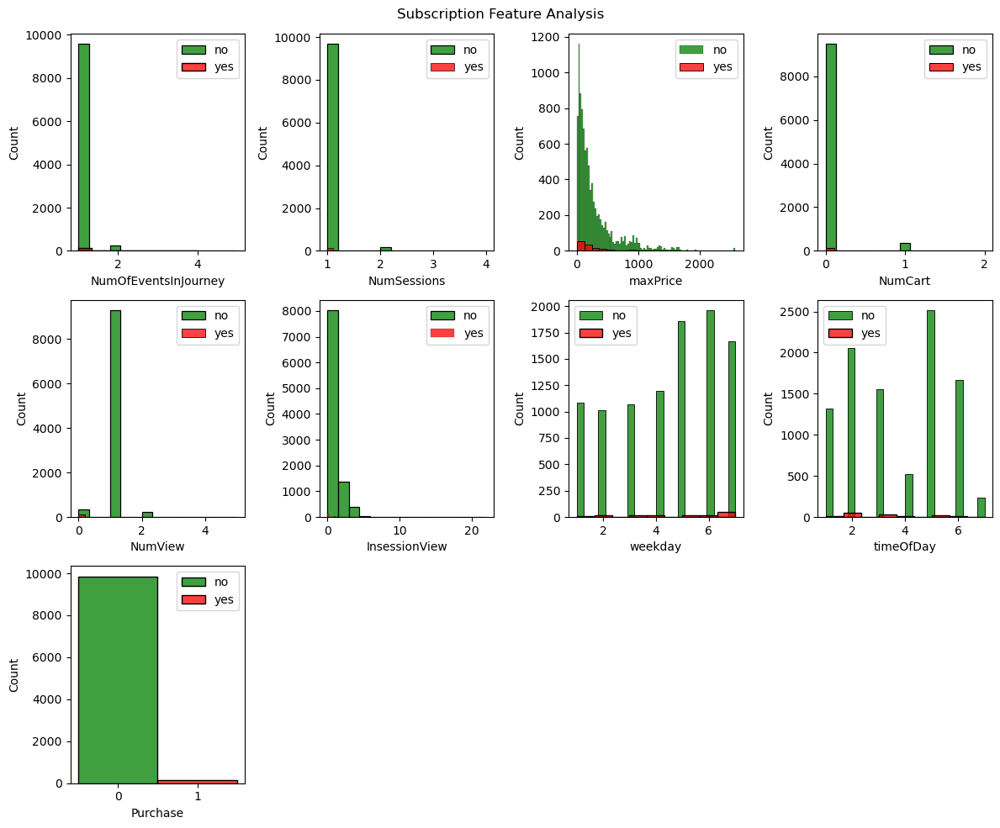

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
train_small_df_reduced = train_small_df[selected_columns]
fig = plt.figure(figsize=(12, 10))
j = 0
for i in train_df_reduced.columns:
    _ = plt.subplot(3, 4, j + 1)
    j += 1
    _ = sns.histplot(train_small_df_reduced[i][train_small_df_reduced['Purchase'] == 0], color='g', label='no')
    _ = sns.histplot(train_small_df_reduced[i][train_small_df_reduced['Purchase'] == 1], color='r', label='yes')
    _ = plt.legend(loc='best');
_ = fig.suptitle('Subscription Feature Analysis')
fig.tight_layout()
fig.subplots_adjust(top=0.95)

plt.show()

6. Make the NumPy arrays `X_train_reduced`, `X_test_reduced`, `y_train` and `y_test` from `train_df_reduced` and `test_df_reduced`. 

In [44]:
# let's take a quick look at these train/test dataframes:
train_df_reduced['Purchase'].value_counts()

0    636839
1      8977
Name: Purchase, dtype: int64

In [45]:
test_df_reduced['Purchase'].value_counts()

0    424424
1      6120
Name: Purchase, dtype: int64

In [46]:
y_train = train_df_reduced['Purchase'].values
y_test = test_df_reduced['Purchase'].values
X_train_reduced = train_df_reduced.drop(columns='Purchase').values
X_test_reduced = test_df_reduced.drop(columns='Purchase').values
print(type(train_df_reduced))
print(type(y_train))
print(y_train.shape)
print(y_test.shape)
print(X_train_reduced.shape)
print(X_test_reduced.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
(645816,)
(430544,)
(645816, 8)
(430544, 8)


7. Scale the features in `X_train_reduced` and `X_test_reduced` use `MinMaxScaler`

In [47]:
from sklearn.preprocessing import MinMaxScaler
# MinMaxScaler is a good choice here for scaling the data since
# it is robust to very small std deviations of features and it
# preserves zero entries in sparse data (which applies to a lot
# of our data as visualized above)

scaler = MinMaxScaler()
X_train_reduced_minmax = scaler.fit_transform(X_train_reduced)

# apply exact same scaling transformation as above to test:
X_test_reduced_minmax  = scaler.transform(X_test_reduced)

## Task 4: Build Logistic Regression and SVM models

We will be fitting both a Logistic Regression and SVM model to the reduced features and then looking at classification metrics such as Accuracy, Precision, Recall, and F1-score.

In [48]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

from sklearn.metrics import (
    confusion_matrix,
    accuracy_score as accuracy,
    recall_score as recall,
    precision_score as precision,
    f1_score
)

1. Instantiate, train, and predict using the Logistic Regression model.

    Make sure to account for the imbalanced classes with with `class_weight` parameter (what happens if we don't?).

    Remember to use the ***train*** data for training the model and the ***test*** data when making predictions.

In [49]:
%%time
lr_model = LogisticRegression(class_weight='balanced').fit(X_train_reduced_minmax, y_train)
lr_pred = lr_model.predict(X_test_reduced_minmax)

CPU times: user 633 ms, sys: 10.5 ms, total: 644 ms
Wall time: 643 ms


2. Calculate these classification metrics for the Logistic Regression model:

    * accuracy
    * precision
    * recall
    * f1 score
    * confusion matrix

In [50]:
print("accuracy:", accuracy(y_test, lr_pred))
print("precision:", precision(y_test, lr_pred))
print("recall:", recall(y_test, lr_pred))
print("f1 score:", f1_score(y_test, lr_pred))
print("confusion matrix:")
print(confusion_matrix(y_test, lr_pred))

accuracy: 0.9999837414991267
precision: 0.9988575159131712
recall: 1.0
f1 score: 0.9994284314526006
confusion matrix:
[[424417      7]
 [     0   6120]]


Classification report for classifier:
LogisticRegression(class_weight='balanced'):

              precision    recall  f1-score   support

           0       1.00      1.00      1.00    424424
           1       1.00      1.00      1.00      6120

    accuracy                           1.00    430544
   macro avg       1.00      1.00      1.00    430544
weighted avg       1.00      1.00      1.00    430544


Confusion matrix, LogisticRegression:
[[424417      7]
 [     0   6120]]


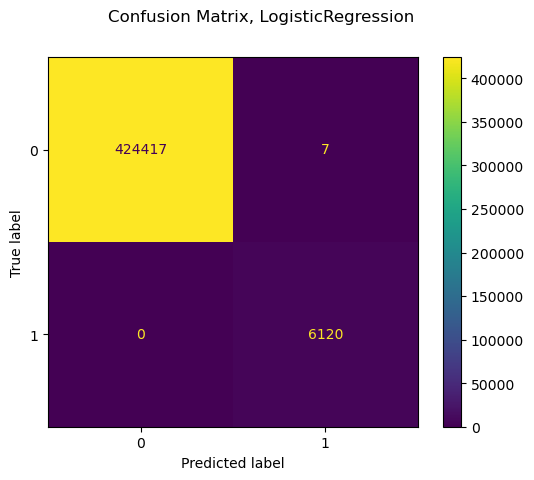

In [51]:
from sklearn import metrics

print(f'Classification report for classifier:\n'
      f"LogisticRegression(class_weight='balanced'):\n\n"
      f'{metrics.classification_report(y_test, lr_pred)}\n')

# plot confusion matrix:
disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, lr_pred)
disp.figure_.suptitle('Confusion Matrix, LogisticRegression')
print(f'Confusion matrix, LogisticRegression:\n{disp.confusion_matrix}')

plt.show();

### _...impressive fit!_

3. Instantiate, train and predict using the SVM model. Check [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html) for usage. 

    Again, remember to account for the class imbalance.

In [52]:
%%time
svm_model = LinearSVC(class_weight='balanced', dual=False)
# dual parameter default=True, but here, we prefer dual=False since samples >> features

svm_model.fit(X_train_reduced_minmax, y_train)
svm_pred = svm_model.predict(X_test_reduced_minmax)

CPU times: user 1.5 s, sys: 30.3 ms, total: 1.53 s
Wall time: 1.53 s


4. ❓ What is the time complexity of SVM? What is it for Logistic Regression? Not familiar with the term "time complexity"? Take a read on [Computational Complexity of ML Models
](https://medium.com/analytics-vidhya/time-complexity-of-ml-models-4ec39fad2770).

### _Answer:_
__Time complexity:__  
Let:  
* `m = # training examples`   
* `n = # features`  

Then time complexity for:
* logistic regression (training):  = `O(m*n)`
* logistic regression (inference): =   `O(n)`
* SVM, e.g. libsvm (training)  = `O(m^2)`
* SVM, e.g. libsvm (inference) = `O(m*n)`
* However, for a _linear SVM_ (_liblinear,_ as used above),  
complexity = `O(m)`  

___:. as we see here, the time to complete the LogisticRegression  
& LinearSVC cells above are comparable.___


5. Calculate the classification metrics for the SVM model. 

Here you can use a helper function to display all the metrics. 

Inspect the source code to understand how to use the function. 

Classification report for classifier LinearSVC(class_weight='balanced', dual=False):
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    424424
           1       1.00      1.00      1.00      6120

    accuracy                           1.00    430544
   macro avg       1.00      1.00      1.00    430544
weighted avg       1.00      1.00      1.00    430544



Confusion matrix, SVM (liblinear):
[[424424      0]
 [     0   6120]]


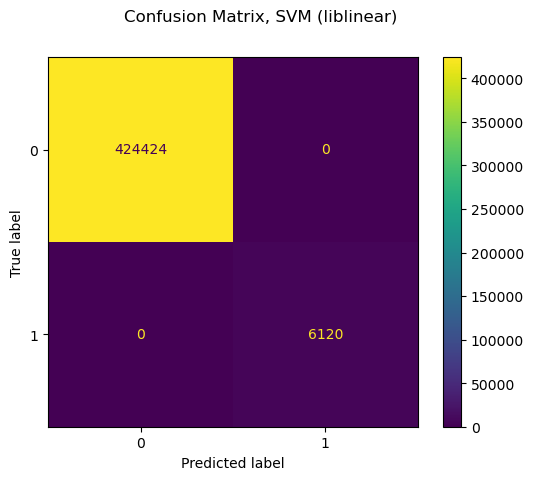

In [53]:
# from utils import display_metrics
# # YOUR CODE HERE

# not sure what the above code refers to specifically;
# will get the classification metrics & confusion matrix via sklearn:

print(f'Classification report for classifier {svm_model}:\n'
      f'{metrics.classification_report(y_test, svm_pred)}\n\n')

# plot confusion matrix:
disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, svm_pred)
disp.figure_.suptitle('Confusion Matrix, SVM (liblinear)')
print(f'Confusion matrix, SVM (liblinear):\n{disp.confusion_matrix}')

plt.show();

Wow, that's impressive! Why do you think SVM performs so well? If you are not familiar with Support Vector Machine, check [In-Depth: Support Vector Machines](https://github.com/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/05.07-Support-Vector-Machines.ipynb) out for better understanding. 

### _Answer:_

##### _...That is truly remarkable, (almost unreasonably so!)  esp given how unbalanced the target classes are..._
As Jake points out, SVMs are esp. powerful classifiers because:
* depend on only a _few support vectors (compact)_
* after training, _prediction is fast_
* affected only by points near the margins (boundaries) ⇒ _work well  
on high-dimensional data (even when # features > # examples!)_
* also, _the linear implementation used here is particularly fast and  
suitable_ since we don't need to invoke any kernel methods to separate the  
target classes

## Task 5: Explanability with SHAP

Intepretation of a linear model such as logistic regression is staightforward, however, some tree-based models have a different reputation. In this task, we will fit a non-linear classifier: begin with gradient boosted tree, and use SHAP to help intepret the model. 

1. What are training coefficients from logistic regression? ( how about SVM? check [How does one interpret SVM feature weights?](https://stats.stackexchange.com/questions/39243/how-does-one-interpret-svm-feature-weights) )

    Leave your comments on interpretation of this logistic regression model.

In [54]:
# YOUR CODE HERE
# training coefficients from logistic regression:
print(f'sklearn LogisticRegression model coefficients:\n\n{lr_model.coef_}\n\n')
print(f'sklearn linear SVM model coefficients:\n\n{svm_model.coef_}')

# let's also remind ourselves of feature column names in training data:
print(f'training data features:\n\n'
      f"{list(train_df_reduced.drop(columns='Purchase').columns)}")

sklearn LogisticRegression model coefficients:

[[ 8.91204723e+01  1.83991703e+01  1.42726222e-01 -7.32285315e+01
  -9.05284173e+01 -1.39726983e+01  7.69012051e-02 -2.10980296e-01]]


sklearn linear SVM model coefficients:

[[ 2.19053161e+01  7.48677538e-02  4.60301878e-05 -1.79334023e+01
  -1.79742542e+01 -1.13564119e-01  9.75319842e-05 -1.35219886e-04]]
training data features:

['NumOfEventsInJourney', 'NumSessions', 'maxPrice', 'NumCart', 'NumView', 'InsessionView', 'weekday', 'timeOfDay']


### _Answer:_
It would appear that while the logistic regression and linear SVM sklearn models  
have assigned different _absolute levels of 'importance'_ to our 8 input features in  
predicting the binary target 'Purchase' class, their ___relative importance___  
is ranked quite similarly by both (viz. _almost identical order):_
* Order of importance of features ___per logistic regression model:___  
NumOfEventsInJourney > NumSessions >> maxPrice > weekday > timeOfDay >  
InsessionView > NumCart > NumView  

* Order of importance of features ___per linear SVM model:___  
NumOfEventsInJourney >> NumSessions >> weekday ~ maxPrice > timeOfDay >  
InSessionView > NumCart ~ NumView

2. Instantiate, train, and predict using the Gradient Boosted Trees model.

In [55]:
from sklearn.ensemble import GradientBoostingClassifier

In [56]:
%%time
gbt_model = GradientBoostingClassifier()
gbt_model.fit(X_train_reduced_minmax, y_train)
gbt_pred = gbt_model.predict(X_test_reduced_minmax)

CPU times: user 20.8 s, sys: 2.49 ms, total: 20.8 s
Wall time: 20.8 s


3. Evaluate the model by calculating the classification metrics.

Classification report for classifier GradientBoostingClassifier():
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    424424
           1       1.00      1.00      1.00      6120

    accuracy                           1.00    430544
   macro avg       1.00      1.00      1.00    430544
weighted avg       1.00      1.00      1.00    430544



Confusion matrix, GradientBoostingClassifier:
[[424422      2]
 [     5   6115]]


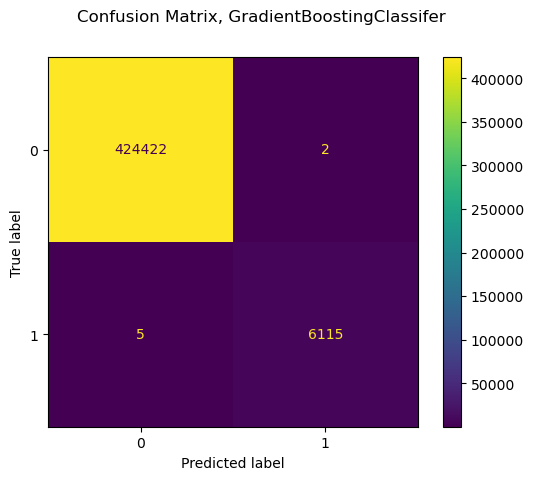

In [57]:
# YOUR CODE HERE
print(f'Classification report for classifier {gbt_model}:\n'
      f'{metrics.classification_report(y_test, gbt_pred)}\n\n')

# plot confusion matrix:
disp = metrics.ConfusionMatrixDisplay.from_predictions(y_test, gbt_pred)
disp.figure_.suptitle('Confusion Matrix, GradientBoostingClassifer')
print(f'Confusion matrix, GradientBoostingClassifier:\n{disp.confusion_matrix}')

plt.show();

4. SHAP (SHapley Additive exPlanations) is a game theory approach to explain the output of any machine learning model. It connects optimal credit allocation with local explanations using the classic Shapley values from game theory and their related extensions. You can use package [SHAP](https://github.com/slundberg/shap). 

    For this task, if you are not familar with the concept, read the book chapter [Interpretable Machine Learning - A Guide for Making Black Box Models Explainable](https://christophm.github.io/interpretable-ml-book/shap.html) first. 

5. Consider experimenting on a smaller dataset. 

For example, start with a subset of 100 samples from the test data.

Once the script works properly, use all the data from `X_test_reduced`. 

Apply `shap.Explainer()` to calculate the SHAP values for the Gradient Boosting classifier you fit earlier.

In [ ]:
np.random.seed(123)
subset_size = 100    # start with 100
idx = np.random.randint(X_test_reduced_minmax.shape[0], size=subset_size)
X_test_reduced_minmax_subset = X_test_reduced_minmax[idx, ]

assert X_test_reduced_minmax_subset.shape == (subset_size, 8)

In [58]:
import shap

explainer = shap.Explainer(gbt_model)

___...Instead of working on the small subset of 100 samples,   
generate the shap_values for the entire test set:___

In [59]:
%%time
shap_values = explainer(X_test_reduced_minmax)

CPU times: user 13 s, sys: 31.8 ms, total: 13 s
Wall time: 13 s


6. visualize the effects over all samples using `shap.plots.beeswarm()` or `shap.summary_plot()`. 

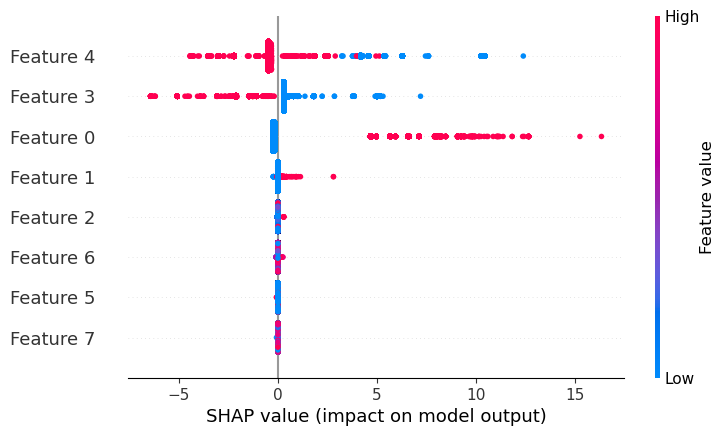

In [60]:
shap.plots.beeswarm(shap_values)

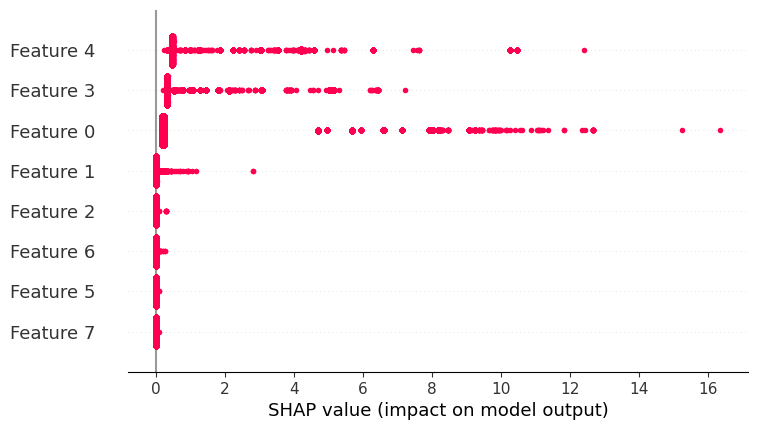

In [61]:
shap.plots.beeswarm(shap_values.abs, color='shap_red')

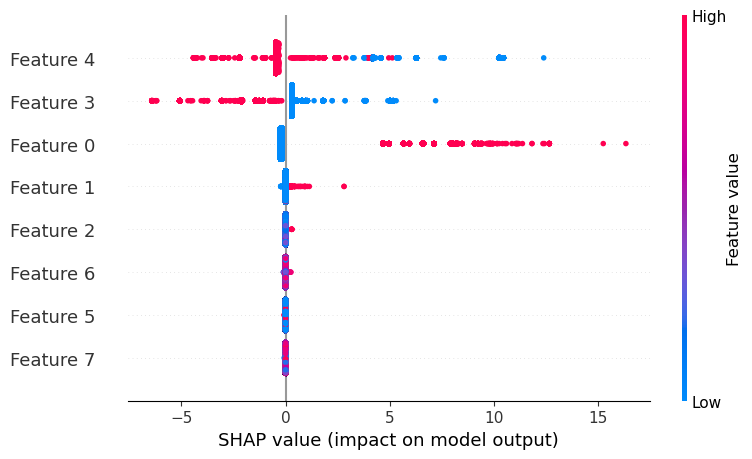

In [62]:
shap.summary_plot(shap_values, X_test_reduced_minmax)

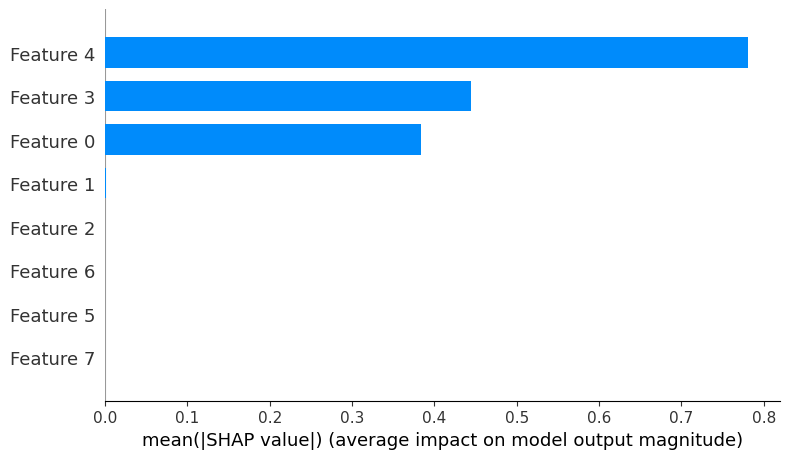

In [63]:
shap.summary_plot(shap_values, X_test_reduced_minmax, plot_type='bar', class_names=gbt_model.classes_)

7. What are features 4, 3, and 1? Does each feature positively or negatively contribute to the likelihood of purchase?

### _Answer:_
Features 4,3, 0, and 1 correspond to:  
* 4 - NumView  
* 3 - NumCart  
* 0 - NumOfEventsInJourney  
* 1 - NumSessions  

_High values of NumView & NumCart features → reduce the likelihood of purchase,  
whereas high values of NumOfEventsInJourney and NumSessions increase the likelihood  
of purchase._

8. Visualize the effects over all samples using `shap.plots.beeswarm()` or `shap.summary_plot()`. 

_(The above plots show shap_values for all test data.)_

9. Write your data (shap values) to a file and add them under the Model Explainability tab in the Streamlit app (see next section), following the example in Model Results tab.

In [64]:
print(type(shap_values))

<class 'shap._explanation.Explanation'>


10. Optional. Do the same for a random forest model.

## Task 6: AutoML

Let's see how AutoML performs on this imbalanced dataset. Similarly, for faster iteration on our workflow, experiment it on a small smaple. 

1. Take 5,000 samples from `train_df`, 5,000 from `test_df` for experimenting.

In [66]:
train_features = train_df.sample(int(5e3), random_state=42)
train_label = train_features.pop('Purchase')
test_features = test_df.sample(int(5e3), random_state=42)
test_label = test_features.pop('Purchase')

2. Instantiate and train a TPOT auto-ML classifier.

    The parameters in the code below are set to low values for faster iterations. 
    Read about each parameters [here](http://epistasislab.github.io/tpot/api/#classification) and experiment with different values when time permits.
    
    Set a proper [`scoring` function](http://epistasislab.github.io/tpot/using/#scoring-functions). 

In [67]:
%%time
from tpot import TPOTClassifier
tpot = TPOTClassifier(generations=10, 
                      population_size=16,
                      scoring='f1',
                      verbosity=2,
                      random_state=42)
tpot.fit(train_features, train_label)
print(f"Tpop score on test data: {tpot.score(test_features, test_label):.2f}")
tpot.export('tpot_electronics_pipeline.py')

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.


Optimization Progress:   0%|          | 0/176 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.9685925925925926

Generation 2 - Current best internal CV score: 0.9685925925925926

Generation 3 - Current best internal CV score: 0.9685925925925926

Generation 4 - Current best internal CV score: 0.9685925925925926

Generation 5 - Current best internal CV score: 0.9685925925925926

Generation 6 - Current best internal CV score: 0.9685925925925926

Generation 7 - Current best internal CV score: 0.9685925925925926

Generation 8 - Current best internal CV score: 0.9846153846153847

Generation 9 - Current best internal CV score: 0.9856960408684546

Generation 10 - Current best internal CV score: 0.9856960408684546

Best pipeline: DecisionTreeClassifier(BernoulliNB(input_matrix, alpha=0.1, fit_prior=True), criterion=entropy, max_depth=9, min_samples_leaf=4, min_samples_split=20)
Tpop score on test data: 0.94
CPU times: user 40.1 s, sys: 159 ms, total: 40.3 s
Wall time: 38.3 s


sklearn.metrics.SCORERS is deprecated and will be removed in v1.3. Please use sklearn.metrics.get_scorer_names to get a list of available scorers and sklearn.metrics.get_metric to get scorer.
X does not have valid feature names, but BernoulliNB was fitted with feature names
X does not have valid feature names, but BernoulliNB was fitted with feature names


3. Examine the model pipeline that TPOT classifier offers in the python file `tpot_electronics_pipeline.py` in the `nb` directory. 
If you see any model, function, or class that are not familiar, look them up!

    Note: There is randomness to the way the TPOT searches, so it's possible you won't have exactly the same result as your classmate.

In [68]:
!cat tpot_electronics_pipeline.py # A sample output

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.pipeline import make_pipeline, make_union
from sklearn.tree import DecisionTreeClassifier
from tpot.builtins import StackingEstimator
from tpot.export_utils import set_param_recursive

# NOTE: Make sure that the outcome column is labeled 'target' in the data file
tpot_data = pd.read_csv('PATH/TO/DATA/FILE', sep='COLUMN_SEPARATOR', dtype=np.float64)
features = tpot_data.drop('target', axis=1)
training_features, testing_features, training_target, testing_target = \
            train_test_split(features, tpot_data['target'], random_state=42)

# Average CV score on the training set was: 0.9856960408684546
exported_pipeline = make_pipeline(
    StackingEstimator(estimator=BernoulliNB(alpha=0.1, fit_prior=True)),
    DecisionTreeClassifier(criterion="entropy", max_depth=9, min_samples_leaf=4, min_samples_split=20)
)
# Fix random state for all th

4. Take the appropriate lines (e.g., updating path to data and the variable names) from `tpot_electronics_pipeline.py` to build a model on our training set and make predictions on the test set. 

    Choose approriate metrics to evaluate the prediction from TPOT. 
    
    Optional. Add this to Streamlit `models` in the next section.

## Advanced Visualizations with Streamlit and Plotly!
Let's visualize our results in a way that makes it easy to compare our models!  
[Streamlit](https://streamlit.io/) is a Python package that makes it easy to create bespoke, dynamic and interactive web apps for visualizations.  
Lightweight web apps like this are a great way to present results to stakeholders! 

First we need to build our results dataset to render in Streamlit.

In [69]:
from collections import defaultdict

results_data = defaultdict(list)

models = ["Logistic Regression", "SVM", "Gradient Boosting Classifier"]

for model, pred in zip(models, [lr_pred, svm_pred, gbt_pred]):
    confusion = confusion_matrix(y_test, pred)
    accuracy_ = accuracy(y_test, pred)
    recall_ = recall(y_test, pred)
    f1 = f1_score(y_test, pred)
    
    results_data['model'].append(model)
    results_data['tn'].append(confusion[0][0])
    results_data['fp'].append(confusion[0][1])
    results_data['fn'].append(confusion[1][0])
    results_data['tp'].append(confusion[1][1])
    results_data['accuracy'].append(accuracy_)
    results_data['recall'].append(recall_)
    results_data['f1_score'].append(f1)
results_df = pd.DataFrame(results_data)
results_df

,model,tn,fp,fn,tp,accuracy,recall,f1_score
0,Logistic Regression,424417,7,0,6120,0.999984,1.000000,0.999428
1,SVM,424424,0,0,6120,1.000000,1.000000,1.000000
2,Gradient Boosting Classifier,424422,2,5,6115,0.999984,0.999183,0.999428


In [70]:
# Write our results_df to CSV
results_df.to_csv("../dat/model_results.csv")

2. Then, we need to built Stremlit app. 
For today's assignment, we wrote the code for you.
However, understand the code in `electronics_purchase_predictions_stremlit.py` because you might need to write a Streamlit web app on your own for the future assignments. 

3. Once you inspected the code, you will need to start streamlit from CLI. 
Try looking up how to do this yourself.

HINT: this is a python file - maybe if you run it as a python file from the CLI, it will give you further instructions. 

Note - once you run the stremlit, the prompt will ask you to provide an email. 
You can leave the email blank. 

And you are done! 

# _Answers to Rubric Questions:_  

#### 1. Algorithm Understanding   

* Is a SVM a supervised/unsupervised learning algorithm?   

___Ans: Supervised:___  This algorithm constructs the 'optimal'  
hyperplane separating classes of data using a 'hinge loss'  
cost function that maximizes the margin (distance) of adjoining  
data points from the classification boundary; it relies on  
correctly labeled data.  


* Why are SVMs so _powerful?_  

As answered previously in this notebook: SVMs are esp. powerful   
classifiers because:  
  * they depend on only a _few support vectors (compact)_  
  * after training, _prediction is fast_  
  * affected only by points near the margins (boundaries) ⇒ _work well    
  on high-dimensional data (even when e.g., # features > # examples!)_  
  * also, _the linear implementation used here is particularly fast and    
  suitable_ since we don't need to invoke any kernel methods to separate the    
  target classes  

  
* What are 3 _disadvantages_ of SVMs?  
  * SVMs invoking kernel methods time-scale at O(m^3) at worst, or O(m^2)  
  at best, where m = # samples; this can be _computationally prohibitive._  
  * SVM results are not associated with a _direct probability interpretation._  
  * The hyperparameter C, which determines the 'hardness' of the boundary  
  margin (that is, how closely points are allowed to lie to it) can be _costly  
  to optimally tune for large datasets._
  
#### 2. Interview Readiness

* What is the time complexity of SVM; LR?  
As discussed previously in the notebook above:    

__Time complexity:__  
Let:  
* `m = # training examples`   
* `n = # features`  

Then time complexity for:
* logistic regression (training):  = `O(m*n)`
* logistic regression (inference): =   `O(n)`
* SVM, e.g. libsvm (training)  = `O(m^2)`
* SVM, e.g. libsvm (inference) = `O(m*n)`
* However, for a _linear SVM_ (_liblinear,_ as used above),  
complexity = `O(m)`  

___:. as we see in this notebook, the time to complete the LogisticRegression  
& LinearSVC cells above are comparable.___

#### 3. Interview Readiness  
* Explain feature importance for Random Forest algorithm:  
Feature importance in Random Forests refers to the fact that this algorithm  
allows one to easily determine the relative importance of each feature in  
determining model output. Scikit-Learn  computes this automatically for each  
feature after training. This helps 'explain' the relative contribution of  
features to the outcome, as well as rank order the features with respect to  
their discriminating power. The latter can be quite helpful for feature selection.  

* Gini impurity: number between 0-1 which measures the 'impurity' of a split  
at a decision-tree node resulting from using a given feature to divide the data.  
In designing an optimal decision-tree classifier, at each tree node, one would  
want to select the feature that minimizes the impurity of the resulting split.  
This continues sequentially through each subsequent node, using the remaining  
features.  

* Information gain is another criterion used to sequentially choose features  
that optimally split a decision tree in e.g. a classification task. In contrast  
to Gini impurity, information gain aims to choose that feature which provides  
the most information about a class, and which thus results in the lowest entropy.  
This process of selection is repeated sequentially starting from the decision  
tree root.

#### 4. SHAP
* based on game theory
* an innovative method that tries to quantify the relative contributions of  
input features to model outcome--thus a form of _AI explainability_ that  
augments our understanding of the key determinants of model predictions  
* more precisely, Shapley values are calculated by determining the average  
of the marginal contributions of features across all permutations  
* the Shap values of each feature, when summed for any given observation,  
represents the difference between the model's prediction and the 'null' model

## References

- This work is motivated by this [publication](https://arxiv.org/pdf/2010.02503.pdf) 
- [Comprehensive Guide on Feature Selection](https://www.kaggle.com/code/prashant111/comprehensive-guide-on-feature-selection/notebook)
- [Common pitfalls and recommended practices](https://scikit-learn.org/stable/common_pitfalls.html)
- [Interactive Shapley Value Demonstration in Python](https://github.com/GeostatsGuy/PythonNumericalDemos/blob/master/Interactive_Shapley_Values.ipynb)
- [Subsurface Data Analytics](https://github.com/GeostatsGuy/PythonNumericalDemos/blob/master/SubsurfaceDataAnalytics_Feature_Ranking.ipynb)